Coursera Applied Data Science Capstone

# THE BATTLE OF AMSTERDAM

Robbert Z.

## WEEK 4

All is written with Python 3.0 using IBM Watson Studio.

# Introduction

Amsterdam is very popular for tourist. Every year approximitly 5.3 mio tourist visit amsterdam of which 4.3 mio forein tourist. Total number of overnight stays per year is 9.8 mio.
Their are 413 hotels with a total of 54.9 thousand beds. But AirBnB is becoming very popular. The number of people who offer (professionally) their house/apartment/room (going forward grouped as "AirBnB-places") is growing every year. 


# Business problem

If you want to rent an AirBnB-places, what are the best or most popular neighbourhoods. And within the most popular neighboorhood what are the kind of venues you can visit.



# Data and analyses

With data from Kaggle, I review which neighborhood is the most popular. 
Popular defined as the highest number of AirBnB-places, the neighborhood with highest number of highest rated AirBnB-places and the neighborhood where AirBnB-places have the highest location score. 
I check if there is any correlation between the different scores. 
I map the AirBnB-places using K-nearest neighbor to show on the map the key neighbourhoods of Amsterdam. 
With the data of foursquare I will analyse the key venues in the key neighborhoods.  
The result of all the analyses will give Amsterdam's most popular neighborhood according to AirBnB users and what the key venues are in these neighborhoods.



-----------------------------------------------------------------------------------------------------------------------

# Week 5

-------------------------------------------

Import libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt


# import k-means from clustering stage
from sklearn.cluster import KMeans

# importing CSV file from Watson dirctory
import types
from botocore.client import Config
import ibm_boto3

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 


from bs4 import BeautifulSoup # import recommended html parsing library

print('Libraries imported.')

Libraries imported.


Install visualization library

In [2]:
!conda install -c conda-forge geopy --yes 
!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /opt/conda/envs/DSX-Python35:

The following NEW packages will be INSTALLED:

    geographiclib: 1.49-py_0   conda-forge
    geopy:         1.19.0-py_0 conda-forge

geographiclib- 100% |################################| Time: 0:00:00  10.84 MB/s
geopy-1.19.0-p 100% |################################| Time: 0:00:00  15.43 MB/s
Fetching package metadata .............
Solving package specifications: .

Package plan for installation in environment /opt/conda/envs/DSX-Python35:

The following NEW packages will be INSTALLED:

    altair:  2.2.2-py35_1 conda-forge
    branca:  0.3.1-py_0   conda-forge
    folium:  0.5.0-py_0   conda-forge
    vincent: 0.4.4-py_1   conda-forge

altair-2.2.2-p 100% |################################| Time: 0:00:00  41.34 MB/s
branca-0.3.1-p 100% |################################| Time: 0:00:00  36.05 MB/s
vincent-0.4.4- 100% |###################

Download Data set from Kaggle:
https://www.kaggle.com/erikbruin/airbnb-amsterdam#listings_details.csv
    

In [129]:
# The code was removed by Watson Studio for sharing.

/opt/conda/envs/DSX-Python35/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2698: DtypeWarning: Columns (87) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [130]:
print(df_data_1.columns)

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       'notes', 'transit', 'access', 'interaction', 'house_rules',
       'thumbnail_url', 'medium_url', 'picture_url', 'xl_picture_url',
       'host_id', 'host_url', 'host_name', 'host_since', 'host_location',
       'host_about', 'host_response_time', 'host_response_rate',
       'host_acceptance_rate', 'host_is_superhost', 'host_thumbnail_url',
       'host_picture_url', 'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'street',
       'neighbourhood', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'city', 'state', 'zipcode', 'market',
       'smart_location', 'country_code', 'country', 'latitude', 'longitude',
       'is_location_exact', 'property_type', 'room_type', 'accommodates',
       'bathrooms',

In [131]:
df_data_1.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [132]:
missing_data = df_data_1.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("") 

id
False    20030
Name: id, dtype: int64

listing_url
False    20030
Name: listing_url, dtype: int64

scrape_id
False    20030
Name: scrape_id, dtype: int64

last_scraped
False    20030
Name: last_scraped, dtype: int64

name
False    19992
True        38
Name: name, dtype: int64

summary
False    19510
True       520
Name: summary, dtype: int64

space
False    14579
True      5451
Name: space, dtype: int64

description
False    19906
True       124
Name: description, dtype: int64

experiences_offered
False    20030
Name: experiences_offered, dtype: int64

neighborhood_overview
False    13257
True      6773
Name: neighborhood_overview, dtype: int64

notes
True     10999
False     9031
Name: notes, dtype: int64

transit
False    13635
True      6395
Name: transit, dtype: int64

access
False    12227
True      7803
Name: access, dtype: int64

interaction
False    11974
True      8056
Name: interaction, dtype: int64

house_rules
False    12571
True      7459
Name: house_rules, dtype: int64

In [133]:
df_Airbnb=df_data_1

In [134]:
df_Airbnb.head(3)

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,reviews_per_month
0,2818,https://www.airbnb.com/rooms/2818,20181206172549,2018-12-06,Quiet Garden View Room & Super Fast WiFi,Quiet Garden View Room & Super Fast WiFi,I'm renting a bedroom (room overlooking the ga...,Quiet Garden View Room & Super Fast WiFi I'm r...,none,"Indische Buurt (""Indies Neighborhood"") is a ne...",From week 38 to week 47 maintenance work to th...,The neighbourhood is well served by 24 hours p...,NaN,NaN,Please: - Leave your shoes in the entrance - ...,NaN,NaN,https://a0.muscache.com/im/pictures/10272854/8...,NaN,3159,https://www.airbnb.com/users/show/3159,Daniel,2008-09-24,"Amsterdam, Noord-Holland, The Netherlands","Upon arriving in Amsterdam, one can imagine as...",within an hour,100%,NaN,t,https://a0.muscache.com/im/users/3159/profile_...,https://a0.muscache.com/im/users/3159/profile_...,Indische Buurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,f,"Amsterdam, North Holland, Netherlands",Indische Buurt,Oostelijk Havengebied - Indische Buurt,NaN,Amsterdam,North Holland,NaN,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.365755,4.941419,f,Apartment,Private room,2,1.5,1.0,2.0,Real Bed,"{Internet,Wifi,""Paid parking off premises"",""Bu...",NaN,$59.00,NaN,"$1,500.00",$100.00,$50.00,1,$20.00,3,15,today,t,17,44,44,44,2018-12-06,248,2009-03-30,2018-11-28,97.0,10.0,10.0,10.0,10.0,9.0,10.0,f,NaN,{Amsterdam},t,f,strict_14_with_grace_period,f,f,1,2.10
1,3209,https://www.airbnb.com/rooms/3209,20181206172549,2018-12-06,"Quiet apt near center, great view",You will love our spacious (90 m2) bright apar...,"Our apartment has lots of light, a balcony and...",You will love our spacious (90 m2) bright apar...,none,Welcome to the Spaarndammerbuurt! From the beg...,NaN,"From Central Station, walk towards the busstop...",You will have the entire house to yourself.,We will meet you in person for check in whenev...,"Our house comes with our very sweet, but old (...",NaN,NaN,https://a0.muscache.com/im/pictures/88955424/4...,NaN,3806,https://www.airbnb.com/users/show/3806,Maartje,2008-10-24,"Amsterdam, Noord-Holland, The Netherlands",I am a freelance radio producer and journalist...,within an hour,100%,NaN,f,https://a0.muscache.com/im/users/3806/profile_...,https://a0.muscache.com/im/users/3806/profile_...,Spaarndammer en Zeeheldenbuurt,1.0,1.0,"['email', 'phone', 'reviews', 'jumio']",t,t,"Amsterdam, Noord-Holland, Netherlands",Spaarndammer en Zeeheldenbuurt,Westerpark,NaN,Amsterdam,Noord-Holland,1013 XE,Amsterdam,"Amsterdam, Netherlands",NL,Netherlands,52.390225,4.873924,t,Apartment,Entire home/apt,5,1.

In [135]:
df_Airbnb = df_Airbnb.drop('listing_url',1).drop('scrape_id',1).drop('last_scraped',1).drop('summary',1).drop('space',1).drop('description',1).drop('experiences_offered',1).drop('neighborhood_overview',1).drop('notes',1).drop('transit',1).drop('access',1).drop('interaction',1).drop('house_rules',1).drop('thumbnail_url',1).drop('medium_url',1).drop('picture_url',1).drop('xl_picture_url',1).drop('host_id',1).drop('host_url',1).drop('host_name',1).drop('host_since',1).drop('host_location',1).drop('host_about',1).drop('host_response_time',1).drop('host_response_rate',1).drop('host_acceptance_rate',1).drop('host_is_superhost',1).drop('host_thumbnail_url',1).drop('host_picture_url',1).drop('host_listings_count',1).drop('host_total_listings_count',1).drop('host_verifications',1).drop('host_has_profile_pic',1).drop('host_identity_verified',1).drop('street',1).drop('neighbourhood_group_cleansed',1).drop('city',1).drop('state',1).drop('zipcode',1).drop('market',1).drop('smart_location',1).drop('country_code',1).drop('country',1).drop('is_location_exact',1).drop('bed_type',1).drop('amenities',1).drop('square_feet',1).drop('weekly_price',1).drop('monthly_price',1).drop('security_deposit',1).drop('guests_included',1).drop('extra_people',1).drop('minimum_nights',1).drop('maximum_nights',1).drop('calendar_updated',1).drop('has_availability',1).drop('availability_30',1).drop('availability_60',1).drop('availability_90',1).drop('availability_365',1).drop('calendar_last_scraped',1).drop('number_of_reviews',1).drop('first_review',1).drop('last_review',1).drop('review_scores_accuracy',1).drop('review_scores_cleanliness',1).drop('review_scores_checkin',1).drop('review_scores_communication',1).drop('review_scores_value',1).drop('requires_license',1).drop('license',1).drop('jurisdiction_names',1).drop('instant_bookable',1).drop('is_business_travel_ready',1).drop('cancellation_policy',1).drop('require_guest_profile_picture',1).drop('require_guest_phone_verification',1).drop('calculated_host_listings_count',1).drop('reviews_per_month',1).drop('host_neighbourhood',1)

In [136]:
df_Airbnb.head(3)

,id,name,neighbourhood,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bedrooms,beds,price,cleaning_fee,review_scores_rating,review_scores_location
0,2818,Quiet Garden View Room & Super Fast WiFi,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419,Apartment,Private room,2,1.5,1.0,2.0,$59.00,$50.00,97.0,9.0
1,3209,"Quiet apt near center, great view",Spaarndammer en Zeeheldenbuurt,Westerpark,52.390225,4.873924,Apartment,Entire home/apt,5,1.0,2.0,2.0,$160.00,$40.00,96.0,9.0
2,20168,100%Centre-Studio 1 Private Floor/Bathroom,Grachtengordel,Centrum-Oost,52.365087,4.893541,Townhouse,Entire home/apt,2,1.0,1.0,1.0,$80.00,NaN,87.0,10.0


In [137]:
df_Airbnb = df_Airbnb.reset_index(drop=True)

In [138]:
df_Airbnb.shape

(20030, 16)

In [139]:
missing_data_2 = df_Airbnb.isnull()
for column in missing_data.columns.values.tolist():
    print(column)
    print (missing_data[column].value_counts())
    print("") 

id
False    20030
Name: id, dtype: int64

listing_url
False    20030
Name: listing_url, dtype: int64

scrape_id
False    20030
Name: scrape_id, dtype: int64

last_scraped
False    20030
Name: last_scraped, dtype: int64

name
False    19992
True        38
Name: name, dtype: int64

summary
False    19510
True       520
Name: summary, dtype: int64

space
False    14579
True      5451
Name: space, dtype: int64

description
False    19906
True       124
Name: description, dtype: int64

experiences_offered
False    20030
Name: experiences_offered, dtype: int64

neighborhood_overview
False    13257
True      6773
Name: neighborhood_overview, dtype: int64

notes
True     10999
False     9031
Name: notes, dtype: int64

transit
False    13635
True      6395
Name: transit, dtype: int64

access
False    12227
True      7803
Name: access, dtype: int64

interaction
False    11974
True      8056
Name: interaction, dtype: int64

house_rules
False    12571
True      7459
Name: house_rules, dtype: int64

In [140]:
df_Airbnb.dropna (axis=0, inplace = True)

In [141]:
df_Airbnb.reset_index(drop=True, inplace=True)

In [142]:
df_Airbnb.shape

(13412, 16)

In [143]:
filtered_columns = ['id', 'neighbourhood','neighbourhood_cleansed', 'latitude', 'longitude']
df_AirLocations = df_Airbnb.loc[:, filtered_columns]
df_AirLocations.head(3)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
0,2818,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,Westerpark,52.390225,4.873924
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668


In [144]:
df_AirLocations.shape

(13412, 5)

Get geographical coordinates of Rijksmusem Amsterdam

In [145]:
address = 'Museumstraat 1, 1071 XX Amsterdam, Netherlands'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print(latitude, longitude)

52.3596306 4.8847566


In [146]:
venues_map = folium.Map(location=[latitude, longitude], zoom_start=15) # generate map centred around Rijksmuseum

In [147]:
# add a red circle marker to represent the Rijksmuseum
folium.features.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup='Rijksmuseum',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_map)

In [148]:
venues_map

In [149]:
df_Neighborhoods = df_AirLocations
df_Neighborhoods.groupby('neighbourhood').count()

,id,neighbourhood_cleansed,latitude,longitude
neighbourhood,,,,
Amsterdam Centrum,286,286,286,286
Banne Buiksloot,61,61,61,61
Bos en Lommer,793,793,793,793
Buiksloterham,72,72,72,72
Buikslotermeer,78,78,78,78
Buitenveldert-Oost,36,36,36,36
Buitenveldert-West,103,103,103,103
De Pijp,1262,1262,1262,1262
De Wallen,199,199,199,199


Sort the Neighbothoods by number of IDs (read=Airbnb locations). 

In [150]:
df_Neighborhoods.groupby(['neighbourhood']).size().reset_index(name='counts').sort_values(by='counts', ascending=False)

,neighbourhood,counts
27,Oud-West,2984
7,De Pijp,1262
2,Bos en Lommer,793
10,Grachtengordel,790
13,Indische Buurt,678
14,Jordaan,671
24,Oosterparkbuurt,659
30,Rivierenbuurt,467
22,Oost,384
11,Hoofddorppleinbuurt,300


TopNeighborhoods are the 10 neighborhoods with the most Airbnb locations

In [151]:
Selected_NH = ['Oud-West','De Pijp', 'Bos en Lommer', 'Grachtengordel','Indische Buurt','Jordaan','Oosterparkbuurt','Rivierenbuurt','Oost','Hoofddorppleinbuurt']
df_TopNeighborhoods = df_Neighborhoods[df_Neighborhoods.neighbourhood.isin(Selected_NH)]
df_TopNeighborhoods.head(10)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
0,2818,Indische Buurt,Oostelijk Havengebied - Indische Buurt,52.365755,4.941419
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668
4,28658,Bos en Lommer,Bos en Lommer,52.375342,4.857289
5,31080,Hoofddorppleinbuurt,Zuid,52.351321,4.848383
8,44129,Jordaan,Centrum-West,52.380711,4.886104
10,46386,De Pijp,De Pijp - Rivierenbuurt,52.352470,4.908254
11,48076,Grachtengordel,Centrum-West,52.380420,4.894535
12,50515,Bos en Lommer,Bos en Lommer,52.377272,4.839253
13,50518,Oud-West,Westerpark,52.382006,4.878650
14,50570,Bos en Lommer,Bos en Lommer,52.377737,4.848912


In [152]:
df_TopNeighborhoods.shape

(8988, 5)

Group neighborhoods by average review score, average location. Which neightborhoods are in the top 10?

In [153]:
filtered_columns_2 = ['id','neighbourhood','review_scores_rating','review_scores_location','latitude','longitude']
df_AirReview = df_Airbnb.loc[:, filtered_columns_2]
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude
0,2818,Indische Buurt,97.0,9.0,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,96.0,9.0,52.390225,4.873924
2,25428,Grachtengordel,100.0,10.0,52.373114,4.883668


In [154]:
df_AirReview['review_scores_rating']=df_AirReview['review_scores_rating']*0.1
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude
0,2818,Indische Buurt,9.7,9.0,52.365755,4.941419
1,3209,Spaarndammer en Zeeheldenbuurt,9.6,9.0,52.390225,4.873924
2,25428,Grachtengordel,10.0,10.0,52.373114,4.883668


In [155]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"review_scores_rating":"mean"}).sort_values(by='review_scores_rating', ascending=False)

,neighbourhood,review_scores_rating
15,Kadoelen,9.675758
35,Stadionbuurt,9.633333
25,Oostzanerwerf,9.580645
17,Museumkwartier,9.579091
11,Hoofddorppleinbuurt,9.570667
22,Oost,9.570312
33,Slotervaart,9.567232
23,Oostelijke Eilanden en Kadijken,9.563874
40,Watergraafsmeer,9.558242
27,Oud-West,9.549263


In [156]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"review_scores_location":"mean"}).sort_values(by='review_scores_location', ascending=False)

,neighbourhood,review_scores_location
0,Amsterdam Centrum,9.958042
10,Grachtengordel,9.922785
8,De Wallen,9.899497
14,Jordaan,9.882265
21,Nieuwmarkt en Lastage,9.872807
17,Museumkwartier,9.872727
42,Westelijke Eilanden,9.830601
7,De Pijp,9.759113
41,Weesperbuurt en Plantage,9.692308
9,Frederik Hendrikbuurt,9.553691


Scatter plot to see correlation between Review Score Rating and Review Scores Location

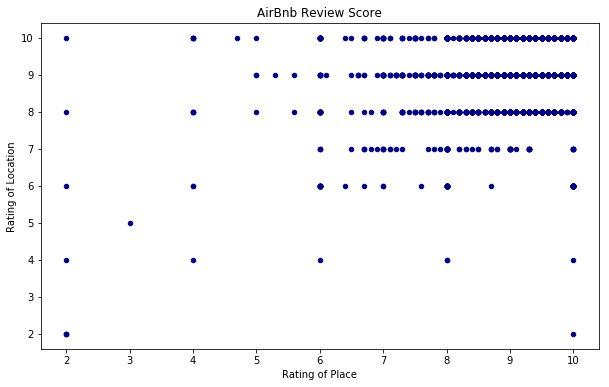

In [157]:
df_AirReview.plot(kind='scatter', x='review_scores_rating', y='review_scores_location', figsize=(10, 6), color='darkblue')

plt.title('AirBnb Review Score')
plt.xlabel('Rating of Place')
plt.ylabel('Rating of Location')

plt.show()


In [158]:
x = df_AirReview['review_scores_rating']      # year on x-axis
y = df_AirReview['review_scores_location']     # total on y-axis
fit = np.polyfit(x, y, deg=1)
fit


array([ 0.38236234,  5.8116432 ])

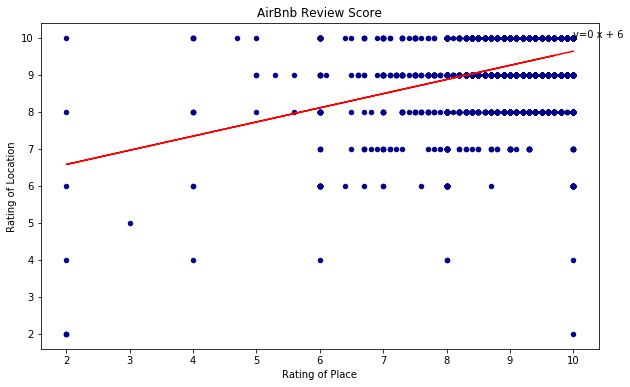

In [159]:
df_AirReview.plot(kind='scatter', x='review_scores_rating', y='review_scores_location', figsize=(10, 6), color='darkblue')

plt.title('AirBnb Review Score')
plt.xlabel('Rating of Place')
plt.ylabel('Rating of Location')

# plot line of best fit
plt.plot(x, fit[0] * x + fit[1], color='red') # recall that x is the Place
plt.annotate('y={0:.0f} x + {1:.0f}'.format(fit[0], fit[1]), xy=(10, 10))

plt.show()



Add both columns together and divide by two. This way one score based on overall rating and location. Column called 'Review_overal_scores'

In [160]:
df_AirReview['Review_overal_scores']=(df_AirReview['review_scores_rating']+df_AirReview['review_scores_location'])/2
df_AirReview.head(3)

,id,neighbourhood,review_scores_rating,review_scores_location,latitude,longitude,Review_overal_scores
0,2818,Indische Buurt,9.7,9.0,52.365755,4.941419,9.35
1,3209,Spaarndammer en Zeeheldenbuurt,9.6,9.0,52.390225,4.873924,9.30
2,25428,Grachtengordel,10.0,10.0,52.373114,4.883668,10.00


In [161]:
df_AirReview.groupby('neighbourhood', as_index=False).agg({"Review_overal_scores":"mean"}).sort_values(by='Review_overal_scores', ascending=False)

,neighbourhood,Review_overal_scores
17,Museumkwartier,9.725909
21,Nieuwmarkt en Lastage,9.680482
14,Jordaan,9.672355
10,Grachtengordel,9.669494
8,De Wallen,9.649749
42,Westelijke Eilanden,9.643443
7,De Pijp,9.633399
0,Amsterdam Centrum,9.629895
41,Weesperbuurt en Plantage,9.581282
9,Frederik Hendrikbuurt,9.530034


TopReviewNH are the 10 neighborhoods with the highest average score 

In [162]:
Selected_TNH = ['Museumkwartier','Nieuwmarkt en Lastage', 'Jordaan', 'Grachtengordel','De Wallen','Westelijke Eilanden','De Pijp','Amsterdam Centrum','Weesperbuurt en Plantage','Frederik Hendrikbuurt']
df_TopReviewNH = df_Neighborhoods[df_Neighborhoods.neighbourhood.isin(Selected_TNH)]
df_TopReviewNH.shape

(4332, 5)

In [163]:
df_TopReviewNH.groupby('neighbourhood').count()

,id,neighbourhood_cleansed,latitude,longitude
neighbourhood,,,,
Amsterdam Centrum,286,286,286,286
De Pijp,1262,1262,1262,1262
De Wallen,199,199,199,199
Frederik Hendrikbuurt,298,298,298,298
Grachtengordel,790,790,790,790
Jordaan,671,671,671,671
Museumkwartier,220,220,220,220
Nieuwmarkt en Lastage,228,228,228,228
Weesperbuurt en Plantage,195,195,195,195


In [164]:
df_TopReviewNH.head(10)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
2,25428,Grachtengordel,Centrum-West,52.373114,4.883668
3,27886,Westelijke Eilanden,Centrum-West,52.386727,4.892078
6,42970,Amsterdam Centrum,Centrum-West,52.367814,4.890012
8,44129,Jordaan,Centrum-West,52.380711,4.886104
10,46386,De Pijp,De Pijp - Rivierenbuurt,52.352470,4.908254
11,48076,Grachtengordel,Centrum-West,52.380420,4.894535
16,53067,De Pijp,De Pijp - Rivierenbuurt,52.353393,4.900638
17,53692,De Pijp,De Pijp - Rivierenbuurt,52.353483,4.900490
18,55256,Nieuwmarkt en Lastage,Centrum-Oost,52.371257,4.903513
19,55709,Grachtengordel,Centrum-Oost,52.358956,4.897259


In [165]:
# add the AirbNB locations as blue circle markers
for lat, lng, label in zip(df_TopReviewNH.latitude, df_TopReviewNH.longitude, df_TopReviewNH.neighbourhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)

# display map
venues_map

# Focus on the most popular neighborhoud: "Museumkwartier"

In [166]:
df_MuseumKwartier = df_TopReviewNH
Selected_MK = ['Museumkwartier']
df_MuseumKwartier = df_TopReviewNH[df_TopReviewNH.neighbourhood.isin(Selected_MK)]
df_MuseumKwartier.shape

(220, 5)

In [167]:
df_MuseumKwartier.head(10)

,id,neighbourhood,neighbourhood_cleansed,latitude,longitude
28,73208,Museumkwartier,Zuid,52.359351,4.876722
95,283170,Museumkwartier,Zuid,52.353532,4.875140
158,431206,Museumkwartier,Zuid,52.354533,4.875221
188,503629,Museumkwartier,Zuid,52.353642,4.878241
190,505650,Museumkwartier,Zuid,52.354995,4.876106
242,594474,Museumkwartier,Zuid,52.353895,4.882060
324,701812,Museumkwartier,Zuid,52.354747,4.872368
331,705509,Museumkwartier,Zuid,52.352947,4.873899
383,770281,Museumkwartier,Zuid,52.356352,4.885888
389,776288,Museumkwartier,Zuid,52.355438,4.874298


In [168]:
# add the AirbNB locations as blue circle markers
for lat, lng, label in zip(df_MuseumKwartier.latitude, df_MuseumKwartier.longitude, df_MuseumKwartier.neighbourhood):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5,
        color='yellow',
        popup=label,
        fill = True,
        fill_color='yellow',
        fill_opacity=0.6
    ).add_to(venues_map)

# display map
venues_map

In [169]:
address = 'Museum Kwartier, Amsterdam'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Museum Kwartier are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Museum Kwartier are 52.3598759, 4.8850584324552.


In [195]:
# Define Foursquare Credentials and Version
CLIENT_ID = 'T44Q3PDJR5YHIMMGCBOE0WH0CKFOCIWSERT4VBCNILK0E3GI' # your Foursquare ID
CLIENT_SECRET = 'LL3MCSLNODYVED5H5ZVMFXUFPVORUHQTJTN3QV0BOSBCYELT' # your Foursquare Secret
VERSION = '20190502' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)


Your credentails:
CLIENT_ID: T44Q3PDJR5YHIMMGCBOE0WH0CKFOCIWSERT4VBCNILK0E3GI
CLIENT_SECRET:LL3MCSLNODYVED5H5ZVMFXUFPVORUHQTJTN3QV0BOSBCYELT


Get the top 100 venues that are in Museum Kwartier within a radius of 500 meter

In [243]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 500 # define radius
# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)
url # display URL

'https://api.foursquare.com/v2/venues/explore?&client_id=T44Q3PDJR5YHIMMGCBOE0WH0CKFOCIWSERT4VBCNILK0E3GI&client_secret=LL3MCSLNODYVED5H5ZVMFXUFPVORUHQTJTN3QV0BOSBCYELT&v=20190502&ll=52.3598759,4.8850584324552&radius=500&limit=100'

In [244]:
# Send the GET request and examine the results
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ccb0a464c1f67439241e976'},
 'response': {'groups': [{'items': [{'reasons': {'count': 0,
       'items': [{'reasonName': 'globalInteractionReason',
         'summary': 'This spot is popular',
         'type': 'general'}]},
      'referralId': 'e-0-4a270706f964a520bd8c1fe3-0',
      'venue': {'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/arts_entertainment/museum_art_',
          'suffix': '.png'},
         'id': '4bf58dd8d48988d18f941735',
         'name': 'Art Museum',
         'pluralName': 'Art Museums',
         'primary': True,
         'shortName': 'Art Museum'}],
       'id': '4a270706f964a520bd8c1fe3',
       'location': {'address': 'Museumstraat 1',
        'cc': 'NL',
        'city': 'Amsterdam',
        'country': 'Nederland',
        'distance': 26,
        'formattedAddress': ['Museumstraat 1',
         '1071 XX Amsterdam',
         'Nederland'],
        'lat': 52.359924435200725,
        'lng': 4.8846810912

In [245]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [246]:
# Now we are ready to clean the json and structure it into a pandas dataframe.
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()


,name,categories,lat,lng
0,Rijksmuseum,Art Museum,52.359924,4.884681
1,Delight Yoga,Yoga Studio,52.361662,4.885688
2,Rijksmuseum Garden (Tuin Rijksmuseum),Garden,52.359530,4.885150
3,De Nachtwacht,Art Gallery,52.359901,4.885196
4,Eregalerij | Gallery of Honour (Eregalerij),Art Museum,52.360240,4.885602


How many venues were returned by Foursquare?

In [247]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))


100 venues were returned by Foursquare.


In [248]:
nearby_venues.groupby('categories').count().sort_values(by="name",ascending=False)

,name,lat,lng
categories,,,
Café,9,9,9
Art Museum,8,8,8
Hotel,5,5,5
Bar,5,5,5
Coffee Shop,4,4,4
Asian Restaurant,3,3,3
Restaurant,3,3,3
Hostel,2,2,2
Plaza,2,2,2


In [249]:
Selected_Cafe = ['Café']
df_cafe = nearby_venues[nearby_venues.categories.isin(Selected_Cafe)]
df_cafe.shape

(9, 4)

In [250]:
df_cafe.head()

,name,categories,lat,lng
17,Cafe De Wetering,Café,52.361153,4.888831
30,Rijksmuseum Café,Café,52.359846,4.885613
56,La Boutique del Caffè Torrefazione,Café,52.357389,4.889090
58,Hans & Grietje,Café,52.361649,4.887152
60,De Balie,Café,52.363209,4.883367


In [251]:
address = 'Museumstraat 1, 1071 XX Amsterdam, Netherlands'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude_1 = location.latitude
longitude_1 = location.longitude
print(latitude_1, longitude_1)

52.3596306 4.8847566


In [252]:
venues_map_1 = folium.Map(location=[latitude_1, longitude_1], zoom_start=15) # generate map centred around Rijksmuseum

In [253]:
# add a red circle marker to represent the Rijksmuseum
folium.features.CircleMarker(
    [latitude_1, longitude_1],
    radius=10,
    color='red',
    popup='Rijksmuseum',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_map_1)

In [254]:
venues_map_1

In [255]:
# add the Cafes as blue circle markers
for lat, lng, label in zip(df_cafe.lat, df_cafe.lng, df_cafe.name):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map_1)

In [256]:
# display map
venues_map_1

# Search for a specific venue category


In [217]:
# Define a query to search for Cafes that are within 500 metres from the Rijksmuseum.
search_query = 'cafe'
radius = 500
print(search_query + ' .... OK!')

cafe .... OK!


In [219]:
#Define the corresponding URL
url_2 = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, search_query, radius, LIMIT)
url_2

'https://api.foursquare.com/v2/venues/search?client_id=T44Q3PDJR5YHIMMGCBOE0WH0CKFOCIWSERT4VBCNILK0E3GI&client_secret=LL3MCSLNODYVED5H5ZVMFXUFPVORUHQTJTN3QV0BOSBCYELT&ll=52.3598759,4.8850584324552&v=20190502&query=cafe&radius=500&limit=100'

In [220]:
results_2 = requests.get(url_2).json()
results_2

{'meta': {'code': 200, 'requestId': '5ccafd52db04f559d84d6ed0'},
 'response': {'venues': [{'categories': [{'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/default_',
       'suffix': '.png'},
      'id': '56aa371be4b08b9a8d573538',
      'name': 'Theme Restaurant',
      'pluralName': 'Theme Restaurants',
      'primary': True,
      'shortName': 'Theme Restaurant'}],
    'hasPerk': False,
    'id': '4a26ff64f964a5206a7f1fe3',
    'location': {'address': 'Max Euweplein 57-61',
     'cc': 'NL',
     'city': 'Amsterdam',
     'country': 'Nederland',
     'distance': 280,
     'formattedAddress': ['Max Euweplein 57-61',
      '1017 MA Amsterdam',
      'Nederland'],
     'labeledLatLngs': [{'label': 'display',
       'lat': 52.36205870673657,
       'lng': 4.882990670552317}],
     'lat': 52.36205870673657,
     'lng': 4.882990670552317,
     'postalCode': '1017 MA',
     'state': 'Noord-Holland'},
    'name': 'Hard Rock Cafe Amsterdam',
    'referralId': 'v-1556806994'},


In [221]:
# assign relevant part of JSON to venues
venues = results_2['response']['venues']

# tranform venues into a dataframe
dataframe = json_normalize(venues)
dataframe.head()


,categories,hasPerk,id,location.address,location.cc,location.city,location.country,location.crossStreet,location.distance,location.formattedAddress,location.labeledLatLngs,location.lat,location.lng,location.neighborhood,location.postalCode,location.state,name,referralId,venuePage.id
0,[{'icon': {'prefix': 'https://ss3.4sqi.net/img...,False,4a26ff64f964a5206a7f1fe3,Max Euweplein 57-61,NL,Amsterdam,Nederland,NaN,280,"[Max Euweplein 57-61, 1017 MA Amsterdam, Neder...","[{'lng': 4.882990670552317, 'lat': 52.36205870...",52.362059,4.882991,NaN,1017 MA,Noord-Holland,Hard Rock Cafe Amsterdam,v-1556806994,NaN
1,[{'icon': {'prefix': 'https://ss3.4sqi.net/img...,False,4c0f7b6e75f99c7420a7ecc4,Weteringschans 157,NL,Amsterdam,Nederland,NaN,353,"[Weteringschans 157, 1017 SE Amsterdam, Nederl...","[{'lng': 4.890242541640259, 'lat': 52.35960862...",52.359609,4.890243,NaN,1017 SE,Noord-Holland,Café Brecht,v-1556806994,NaN
2,[{'icon': {'prefix': 'https://ss3.4sqi.net/img...,False,4a26ff73f964a520c57f1fe3,Prinsengracht 568,NL,Amsterdam,Nederland,Spiegelgracht,353,"[Prinsengracht 568 (Spiegelgracht), 1017 KR Am...","[{'lng': 4.887868807568807, 'lat': 52.36254325...",52.362543,4.887869,NaN,1017 KR,Noord-Holland,Café Heuvel,v-1556806994,NaN
3,[{'icon': {'prefix': 'https://ss3.4sqi.net/img...,False,4a270888f964a52009911fe3,Leidseplein 26,NL,Amsterdam,Nederland,Stadsschouwburg Amsterdam,481,"[Leidseplein 26 (Stadsschouwburg Amsterdam), 1...","[{'lng': 4.882503981921135, 'lat': 52.36391400...",52.363914,4.882504,NaN,1017 PT,Noord-Holland,Café Brasserie Stadsschouwburg,v-1556806994,NaN
4,[{'icon': {'prefix': 'https://ss3.4sqi.net/img...,False,4a26ffb5f964a520b2801fe3,Leidsekade 97,NL,Amsterdam,Nederland,NaN,491,"[Leidsekade 97, 1017 PN Amsterdam, Nederland]","[{'lng': 4.881611402053118, 'lat': 52.36376069...",52.363761,4.881611,NaN,1017 PN,Noord-Holland,Café Américain,v-1556806994,146582666


In [223]:
# Define information of interest and filter dataframe
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
dataframe_filtered = dataframe.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

dataframe_filtered


,name,categories,address,cc,city,country,crossStreet,distance,formattedAddress,labeledLatLngs,lat,lng,neighborhood,postalCode,state,id
0,Hard Rock Cafe Amsterdam,Theme Restaurant,Max Euweplein 57-61,NL,Amsterdam,Nederland,NaN,280,"[Max Euweplein 57-61, 1017 MA Amsterdam, Neder...","[{'lng': 4.882990670552317, 'lat': 52.36205870...",52.362059,4.882991,NaN,1017 MA,Noord-Holland,4a26ff64f964a5206a7f1fe3
1,Café Brecht,Bar,Weteringschans 157,NL,Amsterdam,Nederland,NaN,353,"[Weteringschans 157, 1017 SE Amsterdam, Nederl...","[{'lng': 4.890242541640259, 'lat': 52.35960862...",52.359609,4.890243,NaN,1017 SE,Noord-Holland,4c0f7b6e75f99c7420a7ecc4
2,Café Heuvel,Bar,Prinsengracht 568,NL,Amsterdam,Nederland,Spiegelgracht,353,"[Prinsengracht 568 (Spiegelgracht), 1017 KR Am...","[{'lng': 4.887868807568807, 'lat': 52.36254325...",52.362543,4.887869,NaN,1017 KR,Noord-Holland,4a26ff73f964a520c57f1fe3
3,Café Brasserie Stadsschouwburg,Café,Leidseplein 26,NL,Amsterdam,Nederland,Stadsschouwburg Amsterdam,481,"[Leidseplein 26 (Stadsschouwburg Amsterdam), 1...","[{'lng': 4.882503981921135, 'lat': 52.36391400...",52.363914,4.882504,NaN,1017 PT,Noord-Holland,4a270888f964a52009911fe3
4,Café Américain,Hotel Bar,Leidsekade 97,NL,Amsterdam,Nederland,NaN,491,"[Leidsekade 97, 1017 PN Amsterdam, Nederland]","[{'lng': 4.881611402053118, 'lat': 52.36376069...",52.363761,4.881611,NaN,1017 PN,Noord-Holland,4a26ffb5f964a520b2801fe3
5,Kingfisher Cafe,Pub,Ferdinand Bolstraat 24,NL,Amsterdam,Nederland,NaN,510,"[Ferdinand Bolstraat 24, 1072 LK Amsterdam, Ne...","[{'lng': 4.8904898, 'lat': 52.35670510000001, ...",52.356705,4.890490,NaN,1072 LK,Noord-Holland,4a26ff6df964a520a47f1fe3
6,Café De Waard,Bar,Leidseplein 14,NL,Amsterdam,Nederland,NaN,532,"[Leidseplein 14, 1017 PT Amsterdam, Nederland]","[{'lng': 4.882714548518426, 'lat': 52.36443797...",52.364438,4.882715,NaN,1017 PT,Noord-Holland,4a26ff5af964a5203d7f1fe3
7,Whisky Café L&B,Whisky Bar,Korte Leidsedwarsstraat 82-84,NL,Amsterdam,Nederland,Leidesekruisstraat,329,[Korte Leidsedwarsstraat 82-84 (Leidesekruisst...,"[{'lng': 4.88520221558183, 'lat': 52.362836807...",52.362837,4.885202,NaN,1017 RD,Noord-Holland,4a270037f964a520b4821fe3
8,Rijksmuseum Café,Café,Museumstraat 1,NL,Amsterdam,Nederland,Museumstraat 1,37,"[Museumstraat 1 (Museumstraat 1), 1071 XX Amst...","[{'lng': 4.885613330862296, 'lat': 52.35984566...",52.359846,4.885613,NaN,1071 XX,Noord-Holland,5284cb6511d2e6ccc1a464f3
9,Zadelhoff Cafe,Restaurant,Museumplein 10,NL,NaN,Nederland,NaN,412,"[Museumplein 10, 1071 DJ, Nederland]","[{'lng': 4.879677468783677, 'lat': 52.35815649...",52.358156,4.879677,NaN,1071 DJ,NaN,506ec0eae4b042ad0c7611f0


In [224]:
dataframe_filtered.name

0           Hard Rock Cafe Amsterdam
1                        Café Brecht
2                        Café Heuvel
3     Café Brasserie Stadsschouwburg
4                     Café Américain
5                    Kingfisher Cafe
6                      Café De Waard
7                    Whisky Café L&B
8                   Rijksmuseum Café
9                     Zadelhoff Cafe
10                        Café Mokum
11                     Café Reynders
12                     Cooldown Café
13                  Café La Bastille
14          Cafe Restaurant Mamouche
15                        Cobra Café
16                Grand Café DeLaMar
17       Cafe Pizza Pasta Restaurant
18                       Cafe B.A.P.
19                Cafetaria de Prins
20                       Café Mulder
21          Grand Café Heineken Hoek
22                     Café Berkhout
23                   Van Gogh Museum
24                       Bakery Cafe
25                  Cafe De Wetering
26                    Café Georgette
2

In [225]:
venues_map_3 = folium.Map(location=[latitude, longitude], zoom_start=15) # generate map centred around the Rijksmuseum


In [226]:
# add a red circle marker to represent the Rijksmuseum
folium.features.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup='Conrad Hotel',
    fill = True,
    fill_color = 'red',
    fill_opacity = 0.6
).add_to(venues_map_3)

In [228]:
# add the Cafe's blue circle markers
for lat, lng, label in zip(dataframe_filtered.lat, dataframe_filtered.lng, dataframe_filtered.name):
    folium.features.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map_3)

# display map
venues_map_3
